Code used to analyze the spectral signal of NERC GMD GIC data


## Dependencies

In [8]:
import numpy as np
import pandas as pd
import glob
import os

import datetime
from datetime import datetime, timedelta

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from sunpy.net import Fido
from sunpy.net import attrs as a
from sunpy.timeseries import TimeSeries

import scipy.signal

import pywt


from pyextremes import plot_mean_residual_life



## Functions

In [73]:
def clean_GIC_data(df,df_sensor_locations):
    '''
    - delete repeated time points
    - delete station if all time points are empty
    - Find how many of the measurements differ from one time step to the next and delete station if on average measurements differ less than once in 5 minutes
    - remove repeat stations from files
    
    '''
    
    # Delete repeated time points
    df = df.drop(df[df.duplicated(subset='datetimes', keep='first')].index)
    
    cols_to_drop = []
    for id_loop in df.columns.to_list():
        
        if (id_loop == 'datetimes'):
            continue
            
        # Delete station if most time points are empty
        if ( (df[id_loop].isna().mean() * 100) > 80.):
            cols_to_drop.append(id_loop)
            continue
            
#     print('cols_to_drop after first filter = {}'.format(cols_to_drop))

    # remove repeat stations from files
    duplicate_lats = df_sensor_locations.duplicated(subset=' Latitude',keep='first')
    duplicate_lons = df_sensor_locations.duplicated(subset=' Longitude',keep='first')
    duplicate_locations = df_sensor_locations['Device ID'].values[np.where( (duplicate_lats.values==True) & (duplicate_lons.values==True) )]

    for d in duplicate_locations:
        try:
            #print(df[str(d)])
            cols_to_drop.append(str(d))
        except:
            print('no df entry for devide ID {}'.format(str(d)))
#         # Check I wrote to guarantee the code above removes duplicate stations (keeping only one of the same lat-long)
#         for a in df_sensor_locations['Device ID'].values[np.where( (duplicate_lats.values==True) & (duplicate_lons.values==True) )]:
#             idx = df_sensor_locations.index[df_sensor_locations['Device ID'] == a].tolist()
#             print('the index of the duplicated lat and lon = {}'.format(a))
#             print(' \t --> {}'.format( df_sensor_locations[idx[0]-2:idx[0]+3] ))

#     print('cols_to_drop after second filter = {}'.format(cols_to_drop))

    # Find how many of the measurements differ from one time step to the next and delete station if measurements repeat for more than 60% of the data 
    for device_id in df.columns.to_list():
        if device_id == 'datetimes':
            continue
        count_zeros = np.count_nonzero(np.diff(df[device_id].values) == 0)
        tmp_len = len(np.argwhere(np.isfinite(df[device_id].values)==True))
        tmp = (count_zeros/tmp_len)*100
#             print('percentage of repeated values = {}'.format( tmp  ))
        if tmp > 60.:
            cols_to_drop.append(device_id)

#     print('cols_to_drop after third filter = {}'.format(cols_to_drop))


    cols_to_drop = list(set(cols_to_drop))
#     print('Total number of columns to drop = {}'.format(len(cols_to_drop)))
#     # some stations were removed in the process of creating the integrated data files, so need to check if all columns to remove exist
    cols_to_drop_final = []
    for c in cols_to_drop:
        if any( str(c) in x for x in df.columns.to_list()):
            cols_to_drop_final.append(str(c))
#         else:
#             print('{} is NOT in the columns list'.format(c))

    df = df.drop(cols_to_drop_final,axis=1)
    
    return df

def visualize_dataframe_columns(df):
    fig, axs = plt.subplots(len(df.columns), 1, figsize=(6, 1.5*len(df.columns)))
    
    for i, col in enumerate(df.columns):
        axs[i].plot(df[col])
        axs[i].set_ylabel(col, rotation=0, labelpad=20, fontsize=10)
        axs[i].set_yticklabels([])
        axs[i].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    
    plt.tight_layout()
    plt.show()
    
def visualize_dataframe_singlecolumn(df,col_name):
    fig, axs = plt.subplots(1, 1, figsize=(10,8))
    
    axs.plot(df['datetimes'],df[col_name])
    axs.set_ylabel(col_name, rotation=0, labelpad=20, fontsize=10)
#     axs[i].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    
    plt.tight_layout()
    plt.show()


In [3]:
def get_sw_one_minute(start_datetime,end_datetime):

    '''
    input datetimes must be in format '%Y/%m/%d %H:%M:%S'
    '''
    

#     sunpy_format = '%Y/%m/%d %H:%M'

#     trange = a.Time(start_datetime.strftime(sunpy_format), end_datetime.strftime(sunpy_format))
    trange = a.Time(start_datetime,end_datetime)
    dataset = a.cdaweb.Dataset('OMNI_HRO2_1MIN')
    result = Fido.search(trange, dataset)

    downloaded_files = Fido.fetch(result[0])
    print(downloaded_files)
    
    sw_data = TimeSeries(downloaded_files, concatenate=True)
    df_SW = sw_data.to_dataframe()
    df_SW['datetimes'] = df_SW.index
    strings_to_match = ['AE_INDEX','BX_GSE','BY_GSM','BZ_GSM']
    filtered_columns = df_SW.filter(items=strings_to_match, axis=1)
    df_SW_filtered = df_SW.drop(columns=df_SW.columns.difference(strings_to_match))

    print(df_SW_filtered.columns)
    datetimes_SW = [t.strftime('%Y/%m/%d %H:%M:%S') for t in df_SW_filtered.index]
    df_SW_filtered['datetimes'] = datetimes_SW



    return df_SW_filtered
    
    

## Read in the integrated data

In [4]:
integrated_data_directory = '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/'
files = glob.glob( os.path.join(integrated_data_directory,'*.csv') )
files

['/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150919.csv',
 '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150317.csv',
 '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20151220.csv',
 '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20130531.csv',
 '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20210512.csv',
 '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20131002.csv',
 '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20170927.csv',
 '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150622.csv',
 '/Users/ryanmc/Documents/Conferences/Ja



----------------------------
working on event: event_20150317
cols_to_drop after first filter = ['10540', '10219', '10425', '10477']
cols_to_drop after second filter = ['10540', '10219', '10425', '10477', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10378', '10379', '10380', '10382', '10383', '10388', '10433', '10436']
cols_to_drop after third filter = ['10540', '10219', '10425', '10477', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10378', '10379', '10380', '10382', '10383', '10388', '10433', '10436', '10435', '10434', '10436', '10379', '10437', '10433', '10432', '10222', '10083', '10254', '10305', '10306', '10399', '10400', '10401', '10364', '1

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20150301_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')


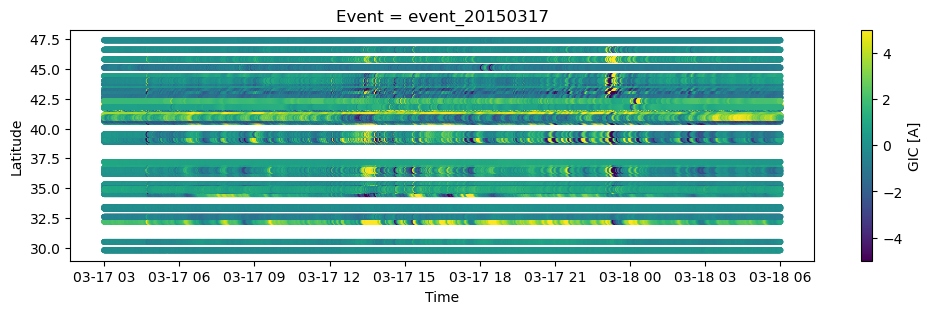

In [104]:
# Calculate and visualize the power spectrum of the GICs for each event


df_total = pd.DataFrame()

for f in files[1:2]:
    df = pd.read_csv(f,index_col=False)
    df = df.drop(columns='Unnamed: 0')
    
    # read in the lat-long values for the sensors in this event
    print('\n\n----------------------------\nworking on event: {}'.format(f[97:-4])) #f.find('event')
#     print('\t--->{}'.format(f))
    file_sensor_locations = os.path.join('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/','risk-resiliency-spwx','data',f[97:-4],'GIC','gic_monitors.csv')

#     print('\t--->{}'.format(file_sensor_locations))
    df_sensor_locations = pd.read_csv(file_sensor_locations)
    
    # Drop unwanted columns, but save IMF and AE index columns
#     df_SW = df(['datetimes','AE_INDEX','BX_GSE','BY_GSM','BZ_GSM']).copy()
    cols_to_drop_loc = df.columns.get_loc('AE_INDEX')
    df.columns.to_list()[cols_to_drop_loc:]
    df = df.drop(df.columns.to_list()[cols_to_drop_loc:],axis = 1)
    
    
    # Clean the data
    df = clean_GIC_data(df,df_sensor_locations)
    df = df.set_index(['datetimes'])
    df.index = pd.to_datetime(df.index)
    
    # Get the SW data
    df_SW_oneminute = get_sw_one_minute(df.index.values[0],df.index.values[-1])

    
    # Plot the data
    plt.figure(figsize=(12,3))
    for i,sensor in enumerate(df):
        location_idx = np.where(int(sensor)==df_sensor_locations['Device ID'].values )[0][0]
        sc = plt.scatter(df.index, 
                         np.tile(df_sensor_locations[' Latitude'].values[location_idx],len(df.index)), 
                         c=df[sensor].values, 
                         cmap='viridis', 
                         s=10,
                         vmin=-5, 
                         vmax=5)
    plt.colorbar(sc, label='GIC [A]')
    plt.xlabel('Time')
    plt.ylabel('Latitude')
    plt.title('Event = ' + str(f[97:-4]))
    plt.show()
    
#     df_total = pd.concat([df_total, df], axis=1)


In [91]:
df.columns.to_list()

['10409',
 '10187',
 '10185',
 '10218',
 '10184',
 '10190',
 '10180',
 '10221',
 '10397',
 '10181',
 '10183',
 '10197',
 '10196',
 '10318',
 '10319',
 '10331',
 '10325',
 '10322',
 '10257',
 '10309',
 '10321',
 '10080',
 '10107',
 '10299',
 '10273',
 '10075',
 '10276',
 '10076',
 '10063',
 '10077',
 '10261',
 '10301',
 '10206',
 '10213',
 '10398',
 '10198',
 '10205',
 '10204',
 '10402',
 '10199',
 '10214',
 '10215',
 '10201',
 '10377',
 '10203',
 '10202',
 '10376',
 '10404']

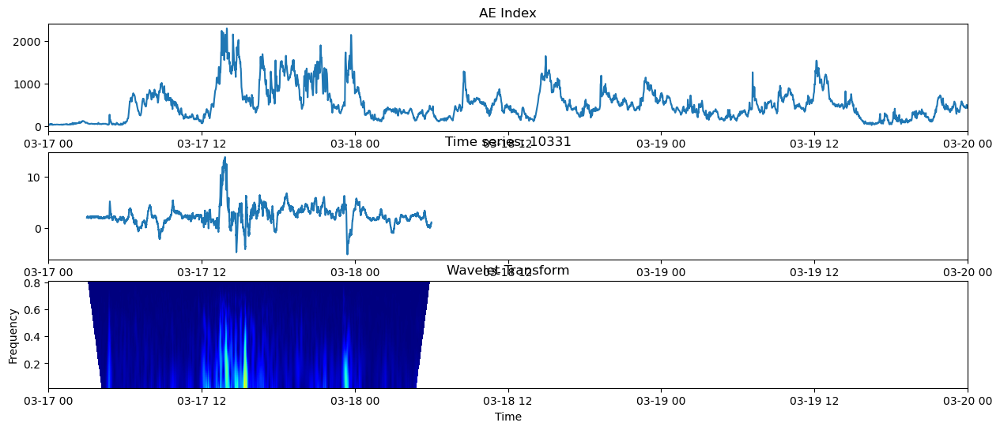

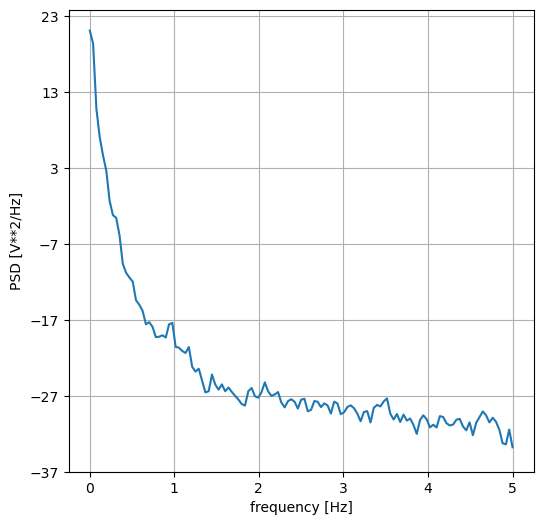

In [103]:

# 10208 	10183 	10197 	10196 	10193 	10187 	10218 	10191 	10184
sensor_val = '10331'#'10218'#'10331'#'10085'#



fig = plt.figure(figsize=(15, 6))
gs = gridspec.GridSpec(3, 1, figure=fig)
# Create plots in the grid
ax1 = plt.subplot(gs[0, 0])  # First row
ax2 = plt.subplot(gs[1, 0])  # Second row
ax3 = plt.subplot(gs[2, 0])  # Third row
# ax4 = plt.subplot(gs[3, 0])  # Fourth row

ax1.plot(df_SW_oneminute.index,df_SW_oneminute['AE_INDEX'])
# ax1.set_xlim([df_SW_oneminute.index[0],df_SW_oneminute.index[-1]])
ax1.set_xlim([df.index[0],df.index[-1]])
ax1.set_title('AE Index')

ax2.plot(df.index,df[sensor_val].values)
ax2.set_xlim([df.index[0],df.index[-1]])
ax2.set_title('Time series: ' + sensor_val)


# Specify wavelet parameters
wavelet_name = 'morl'
scales = np.arange(1, 50)


series = df[sensor_val].values
coefficients, frequencies = pywt.cwt(series, scales, wavelet_name)

ax = ax3.imshow(np.abs(coefficients), extent=[df.index.values[0], df.index.values[-1], frequencies[-1], frequencies[0]], aspect='auto', cmap='jet')
# fig.colorbar(a,cax=ax3,label='Magnitude',orientation='horizontal')
ax3.set_xlabel('Time')
ax3.set_ylabel('Frequency')
ax3.set_title('Wavelet Transform')


plt.show()



fig2 = plt.figure(figsize=(6, 6))
fs = 10.0 # 10 Hz sampling frequency

signal = df[sensor_val].values
signal = signal[~np.isnan(signal)]

# (f, S) = scipy.signal.periodogram(signal, fs, scaling='density')
# plt.semilogy(f, S)
# # plt.ylim([1e-7, 1e2])
# # plt.xlim([0,100])
# plt.xlabel('frequency [Hz]')
# plt.ylabel('PSD [V**2/Hz]')
# plt.grid(True)
# plt.title('PSD')

(S, f) = plt.psd(signal, Fs=fs)

# plt.semilogy(f, S)
# plt.xlim([0, 100])
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [V**2/Hz]')
plt.show()

plt.show()


In [112]:
df[sensor_val_loop]

datetimes
2015-03-17 00:00:00   NaN
2015-03-17 00:00:10   NaN
2015-03-17 00:00:20   NaN
2015-03-17 00:00:30   NaN
2015-03-17 00:00:40   NaN
                       ..
2015-03-19 23:59:20   NaN
2015-03-19 23:59:30   NaN
2015-03-19 23:59:40   NaN
2015-03-19 23:59:50   NaN
2015-03-20 00:00:00   NaN
Name: 10318, Length: 25921, dtype: float64

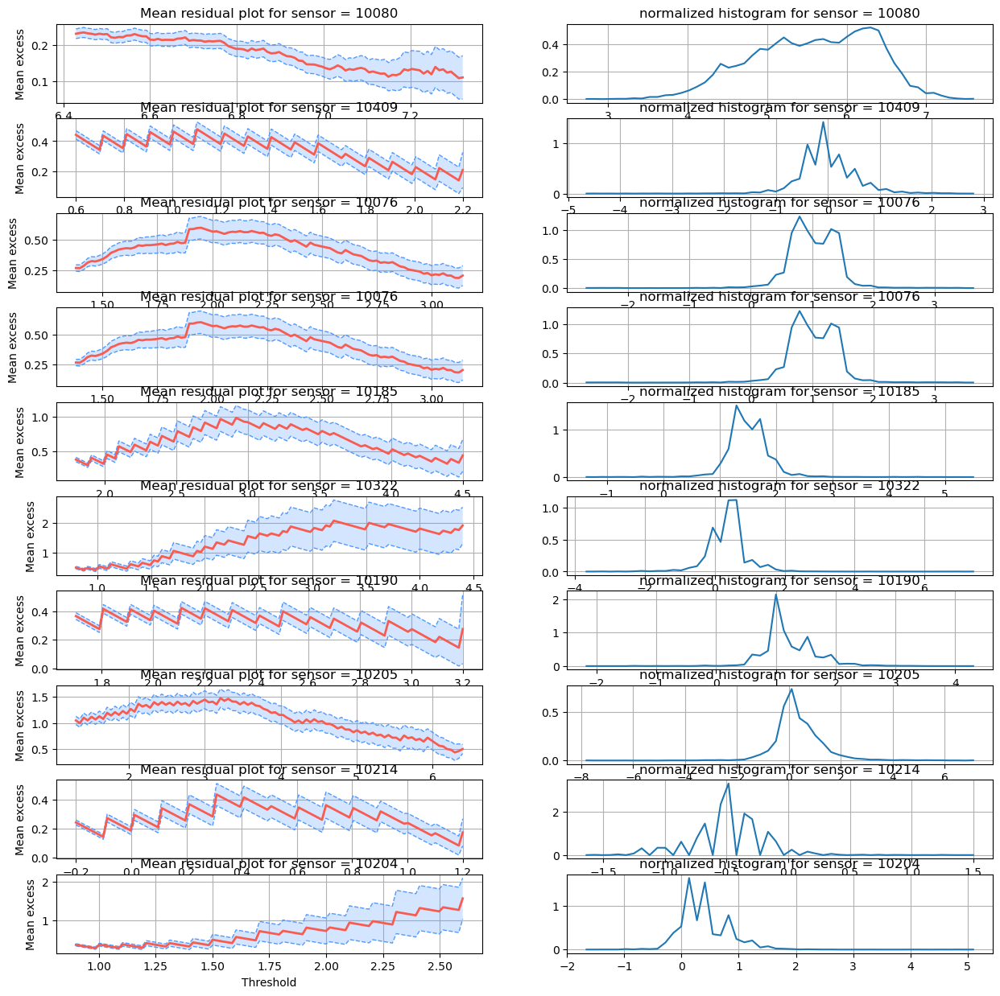

In [122]:
# Analyze for extreme value analyses
# mean excess plot


fig = plt.figure(figsize=(15,15))
gs = gridspec.GridSpec(10, 2, figure=fig)



for s in range(0,10):
    sensor_val_loop = np.random.choice(df.columns.to_list())

    ax1 = plt.subplot(gs[s, 0])
    plot_mean_residual_life(df[sensor_val_loop][~np.isnan(df[sensor_val_loop])],ax=ax1)
    ax1.set_title('Mean residual plot for sensor = ' + sensor_val_loop)
    ax1.grid(True)
    
    ax2 = plt.subplot(gs[s, 1])
    counts, bin_edges = np.histogram(df[sensor_val_loop][~np.isnan(df[sensor_val_loop])], 
                                     bins=50,
                                     density=True)    
    plt.plot(bin_edges[1:],counts)    
    ax2.set_title('normalized histogram for sensor = ' + sensor_val_loop)
    ax2.grid(True)






In [131]:
max_values = df.max(axis=1)

# plt.figure()
# plt.scatter(df.index,max_values)
# plt.grid(True)
# plt.xlabel('Maximum GIC')
# plt.ylabel('Datetime')


import plotly.graph_objects as go
import plotly.offline as pyo
from plotly.subplots import make_subplots


fig = make_subplots(rows=2, cols=1,shared_xaxes=True,)

fig.add_trace(go.Scatter(
                    x=df_SW_oneminute.index,
                    y=df_SW_oneminute['AE_INDEX'].values,
                    mode='markers',
                    name='AE Index'
                  ), 
              row=1, col=1)
,

fig.add_trace(go.Scatter(
                    x=df.index,
                    y=max_values,
                    mode='markers',
                    name='Max GIC'
                  ), 
              row=2, col=1)

fig.update_xaxes(range=[df.index[0], df.index[-1]])

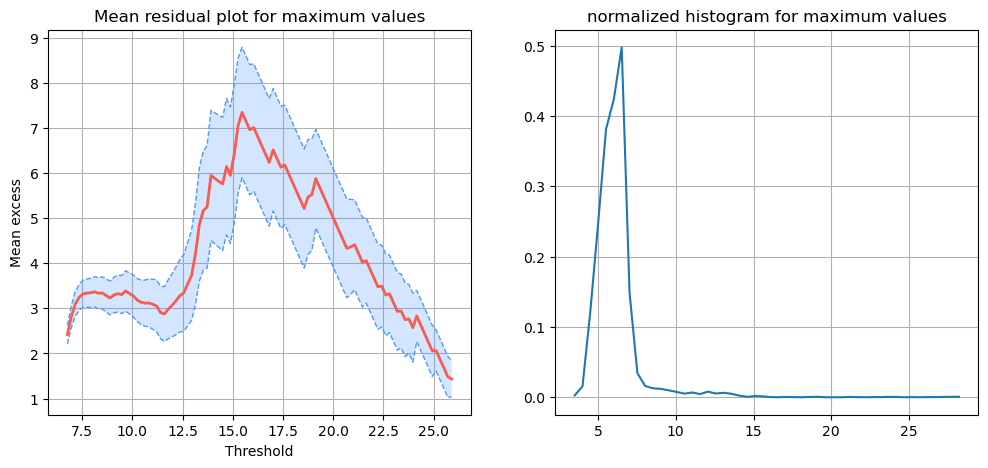

In [134]:
# Plot the mean excess plot using the event maxima
fig = plt.figure(figsize=(12,5))
gs = gridspec.GridSpec(1, 2, figure=fig)

ax1 = plt.subplot(gs[0, 0])
plot_mean_residual_life(max_values[~np.isnan(max_values)],ax=ax1)
ax1.set_title('Mean residual plot for maximum values')
ax1.grid(True)

ax2 = plt.subplot(gs[0, 1])
counts, bin_edges = np.histogram(max_values[~np.isnan(max_values)], 
                                 bins=50,
                                 density=True)    
plt.plot(bin_edges[1:],counts)    
ax2.set_title('normalized histogram for maximum values')
ax2.grid(True)

In [148]:
df

,datetimes,10107,10305,10273,10306,10075,10077,10261,10301,10207,...,10318,10085,10078,10252,10079,10257,10322,10309,10321,10080
0,2015-09-11 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2015-09-11 00:00:10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2015-09-11 00:00:20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2015-09-11 00:00:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2015-09-11 00:00:40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19847,2015-09-12 23:59:20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19848,2015-09-12 23:59:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19849,2015-09-12 23:59:40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19850,2015-09-12 23:59:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN






----------------------------
working on event: event_20150919
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150919.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20150901_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10425']
cols_to_drop after second filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10385', '10387', '10388', '10433', '10436']
cols_to_drop after third filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10385', '10387', '10388', '10433', '10436', '10200', '10412', '10406', '10361', '10407', '10413', '10405', '10411', '10388', '10410', '10404', '10362', '10400', '10399', '10401', '10402', '10364', '10276', '10076', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20150317
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150317.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20150301_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10540', '10219', '10425', '10477']
cols_to_drop after second filter = ['10540', '10219', '10425', '10477', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10378', '10379', '10380', '10382', '10383', '10388', '10433', '10436']
cols_to_drop after third filter = ['10540', '10219', '10425', '10477', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10378', '10379', '10380', '10382', '10383', '10388', '10433', '10436', '10435', '10434', '10436', '10379', '10437', '10433', '10432', '10222', '10083', '10254', '10305', '10306', '10399', '10400', '10401', '10364', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20151220
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20151220.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20151201_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10120', '10119', '10425', '10263', '10116', '10112']
cols_to_drop after second filter = ['10120', '10119', '10425', '10263', '10116', '10112', '10224', '10300', '10320', '10081', '10085', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10387', '10388', '10433', '10436']
cols_to_drop after third filter = ['10120', '10119', '10425', '10263', '10116', '10112', '10224', '10300', '10320', '10081', '10085', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10387', '10388', '10433', '10436', '10083', '10254', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20130531
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20130531.csv


Files Downloaded:   0%|          | 0/2 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20130501_v01.cdf', '/Users/ryanmc/sunpy/data/omni_hro2_1min_20130601_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10555', '10486', '10508', '10562']
cols_to_drop after second filter = ['10555', '10486', '10508', '10562', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10379', '10380', '10381', '10384', '10433', '10436']
cols_to_drop after third filter = ['10555', '10486', '10508', '10562', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10379', '10380', '10381', '10384', '10433', '10436', '10431', '10381', '10222', '10434', '10435', '10409', '10437', '10436', '10322', '10318', '10075', '10077', '10406', '10412', '10404', '10362', '10410', '10411', '10405', '10363', '10401', '10400', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20210512
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20210512.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20210501_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10103', '10117', '10116', '10102', '10115', '10111', '10112', '10099', '10113', '10121', '10120', '10119']
cols_to_drop after second filter = ['10103', '10117', '10116', '10102', '10115', '10111', '10112', '10099', '10113', '10121', '10120', '10119', '10072', '10073', '10098', '10300', '10304', '10306', '10311', '10312', '10314', '10315', '10317', '10319', '10320', '10338', '10340', '10342', '10344', '10345', '10347', '10350', '10351', '10352', '10356', '10078', '10080', '10081', '10082', '10084', '10085', '10230', '10231', '10258', '10259', '10260', '10262', '10263', '10264', '10293', '10295', '10333', '10334', '10335', '10346', '10088', '10192', '10209', '10249']
cols_to_drop after third filter = ['10103', '10117', '10116', '10102', '10115', '10111', '10112', '10099', '10113', '10121', '10120', '10119', '10072', '10073', '10098', '10300', '10304', '10306', '10311', '10312', '10314', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20131002
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20131002.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20131001_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10115', '10116', '10112', '10323', '10121', '10119', '10425']
cols_to_drop after second filter = ['10115', '10116', '10112', '10323', '10121', '10119', '10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10378', '10379', '10380', '10382', '10384', '10386', '10388', '10433', '10436']
cols_to_drop after third filter = ['10115', '10116', '10112', '10323', '10121', '10119', '10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10378', '10379', '10380', '10382', '10384', '10386', '10388', '10433', '10436', '10406', '10361', '10405', '10362', '10404', '10399', '10400', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20170927
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20170927.csv


Files Downloaded:   0%|          | 0/2 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20170901_v01.cdf', '/Users/ryanmc/sunpy/data/omni_hro2_1min_20171001_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10120', '10119', '10427', '10425', '10237', '10428', '10115', '10117', '10116']
cols_to_drop after second filter = ['10120', '10119', '10427', '10425', '10237', '10428', '10115', '10117', '10116', '10072', '10098', '10224', '10300', '10320', '10338', '10342', '10344', '10345', '10347', '10078', '10081', '10230', '10231', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10334', '10335', '10346', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10421', '10220', '10286', '10290', '10378', '10379', '10380', '10381', '10383', '10384', '10385', '10386', '10388', '10433', '10436']
cols_to_drop after third filter = ['10120', '10119', '10427', '10425', '10237', '10428', '10115', '10117', '10116', '10072', '10098', '10224', '10300', '10320', '10338', '10342', '10344', '10345', '10347', '10078', '10081', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20150622
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150622.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20150601_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10425']
cols_to_drop after second filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10378', '10379', '10380', '10382', '10383', '10384', '10387', '10388', '10433', '10436']
cols_to_drop after third filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10378', '10379', '10380', '10382', '10383', '10384', '10387', '10388', '10433', '10436', '10401', '10400', '10399', '10364', '10402', '10407', '10361', '10200', '10360', '10362', '10203', '10363', '10405', '10299', '10076', '10300', '10325', '10324', '10083', '10385', '10435', '10437', '10379', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20170527
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20170527.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20170501_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10348', '10428', '10114', '10116', '10117', '10113', '10338', '10111', '10336', '10120', '10335', '10119', '10427', '10341', '10236', '10342', '10420', '10232', '10231']
cols_to_drop after second filter = ['10348', '10428', '10114', '10116', '10117', '10113', '10338', '10111', '10336', '10120', '10335', '10119', '10427', '10341', '10236', '10342', '10420', '10232', '10231', '10072', '10098', '10224', '10300', '10320', '10338', '10342', '10344', '10345', '10347', '10081', '10230', '10231', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10335', '10346', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10421', '10220', '10290', '10378', '10380', '10381', '10383', '10384', '10386', '10388', '10433', '10436']
cols_to_drop after third filter = ['10348', '10428', '10114', '10116', '10117', '10113', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20180825
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20180825.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20180801_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10095', '10485', '10491', '10452', '10484', '10241', '10096', '10243', '10492', '10120', '10530', '10242', '10518', '10246', '10468', '10119', '10509', '10245', '10480', '10457', '10244', '10551', '10425', '10550', '10578', '10552', '10426', '10427', '10568', '10541', '10567', '10576', '10563', '10575', '10428', '10560', '10574', '10117', '10116', '10102', '10466', '10504', '10470', '10114', '10115', '10465', '10111', '10099', '10489', '10113', '10488']
cols_to_drop after second filter = ['10095', '10485', '10491', '10452', '10484', '10241', '10096', '10243', '10492', '10120', '10530', '10242', '10518', '10246', '10468', '10119', '10509', '10245', '10480', '10457', '10244', '10551', '10425', '10550', '10578', '10552', '10426', '10427', '10568', '10541', '10567', '10576', '10563', '10575', '10428', '10560', '10574', '10117', '10116', '10102', '10466', '10504', '10470', '10114', '10115',

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20170907
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20170907.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20170901_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10427', '10425', '10084']
cols_to_drop after second filter = ['10427', '10425', '10084', '10072', '10098', '10224', '10300', '10320', '10338', '10342', '10344', '10345', '10347', '10078', '10081', '10084', '10085', '10230', '10231', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10334', '10335', '10346', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10421', '10220', '10290', '10378', '10379', '10380', '10381', '10383', '10384', '10385', '10386', '10388', '10433', '10436']
cols_to_drop after third filter = ['10427', '10425', '10084', '10072', '10098', '10224', '10300', '10320', '10338', '10342', '10344', '10345', '10347', '10078', '10081', '10084', '10085', '10230', '10231', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10334', '10335', '10346', '10360', '10361', '10364', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20220409
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20220409.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20220401_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10255', '10102', '10099']
cols_to_drop after second filter = ['10255', '10102', '10099', '10098', '10300', '10304', '10311', '10312', '10314', '10315', '10317', '10258', '10259', '10260', '10262', '10263', '10264', '10293', '10209', '10249']
cols_to_drop after third filter = ['10255', '10102', '10099', '10098', '10300', '10304', '10311', '10312', '10314', '10315', '10317', '10258', '10259', '10260', '10262', '10263', '10264', '10293', '10209', '10249', '10197', '10357', '10196', '10182', '10209', '10591', '10208', '10220', '10191', '10218', '10219', '10192', '10193', '10309', '10296', '10297', '10308', '10322', '10121', '10253', '10051', '10252', '10118', '10318', '10293', '10052', '10300', '10315', '10301', '10115', '10317', '10316', '10299', '10307', '10111', '10113', '10305', '10311', '10310', '10205', '10211', '10204', '10199']
Total number of columns to drop = 57
10314 is NOT in t

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20151006
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20151006.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20151001_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10425']
cols_to_drop after second filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10385', '10387', '10388', '10433', '10436']
cols_to_drop after third filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10385', '10387', '10388', '10433', '10436', '10276', '10300', '10299', '10360', '10406', '10361', '10407', '10405', '10363', '10388', '10404', '10362', '10400', '10414', '10399', '10401', '10402', '10433', '10432', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20150911
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150911.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20150901_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10425']
cols_to_drop after second filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10384', '10385', '10387', '10388', '10433', '10436']
cols_to_drop after third filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10384', '10385', '10387', '10388', '10433', '10436', '10299', '10276', '10300', '10076', '10401', '10400', '10414', '10399', '10402', '10407', '10361', '10406', '10360', '10200', '10362', '10404', '10405', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)


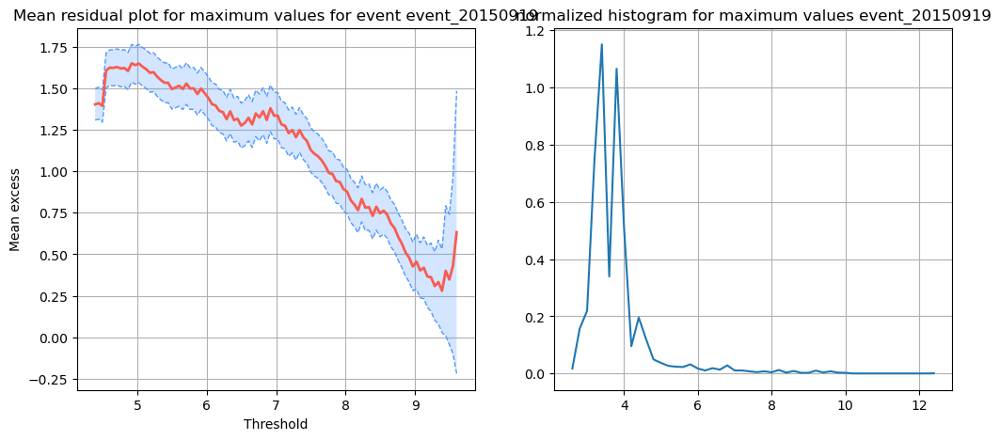

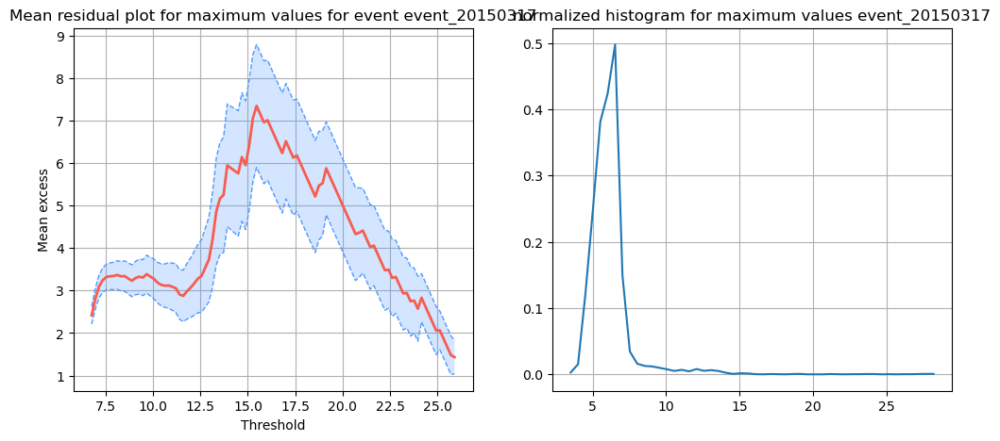

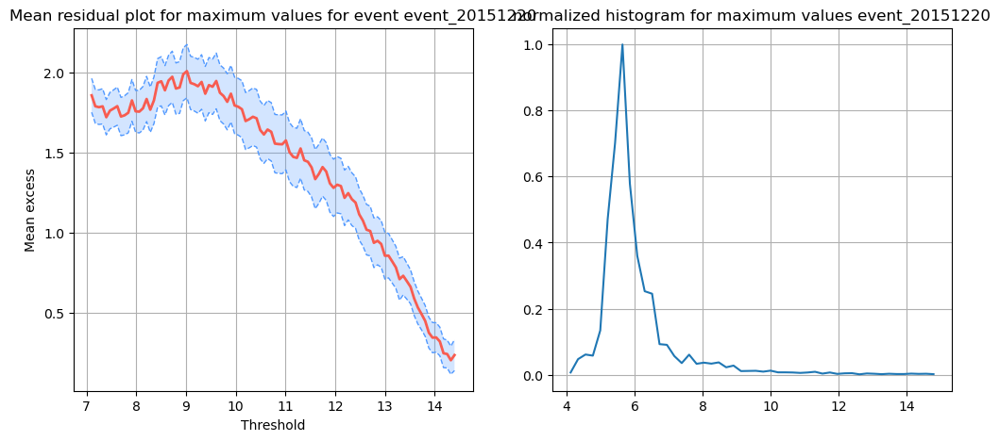

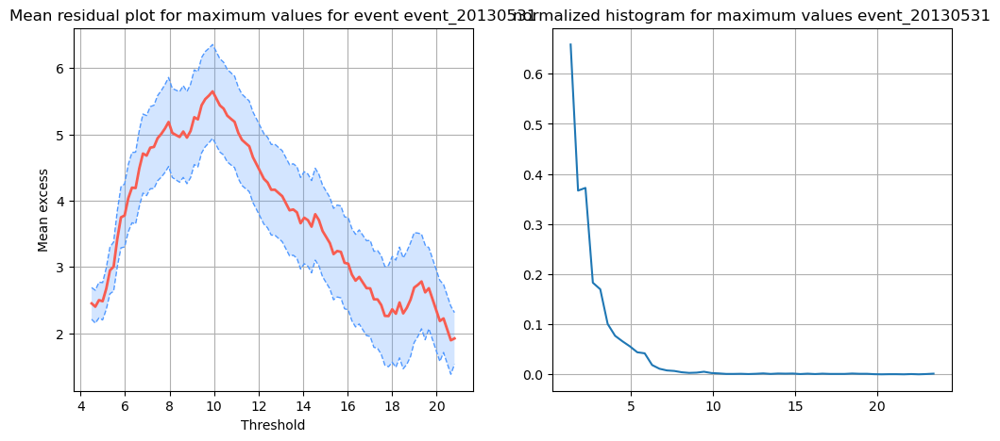

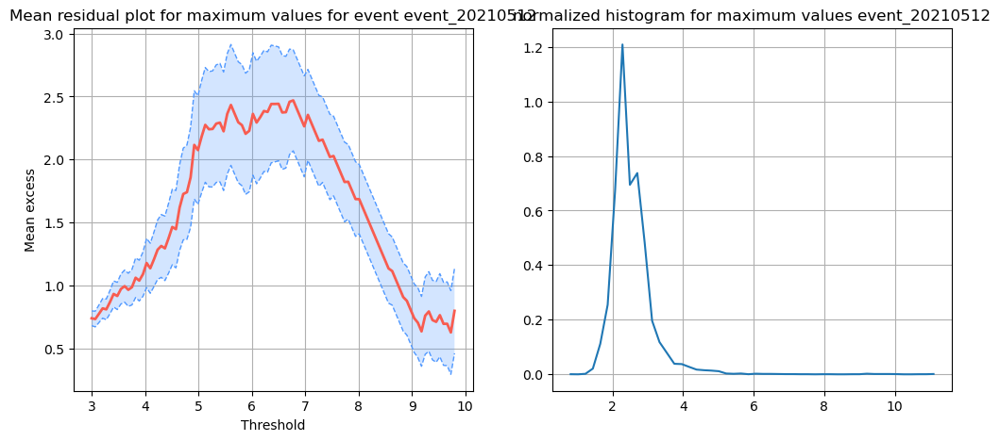

...

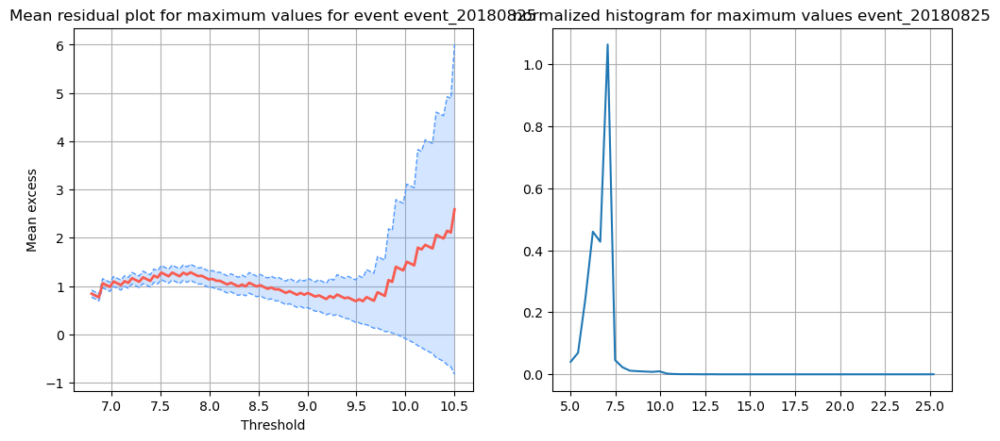

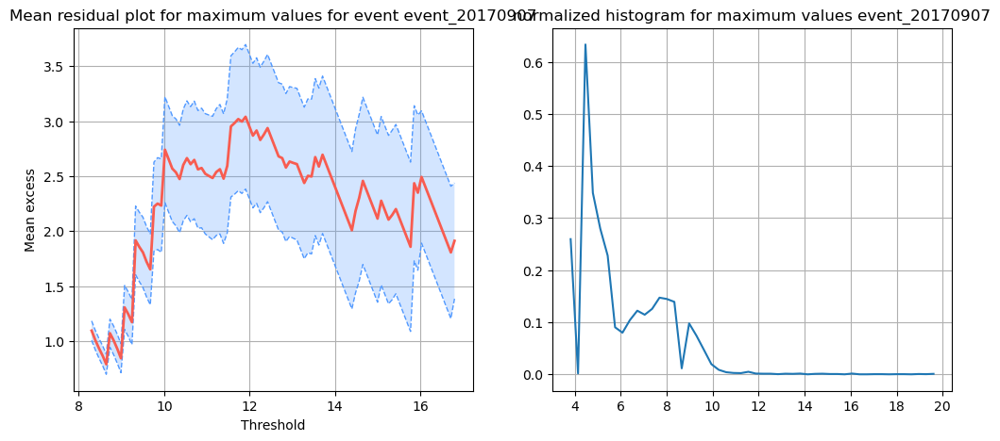

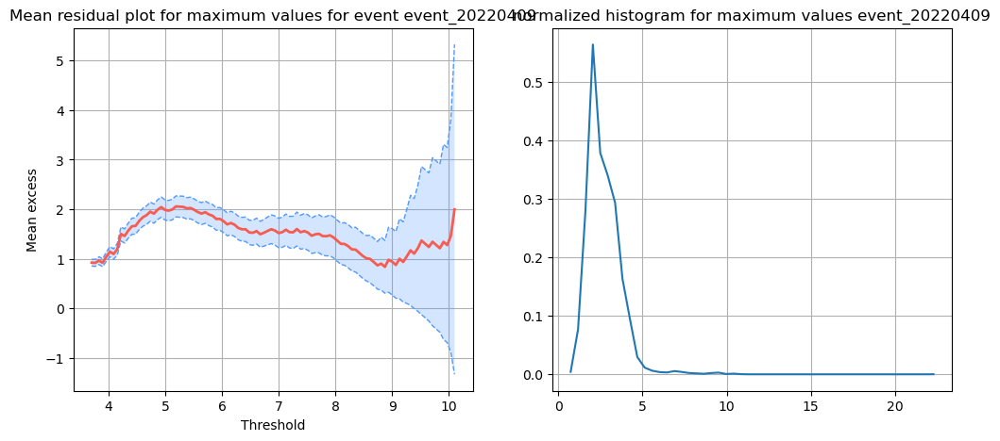

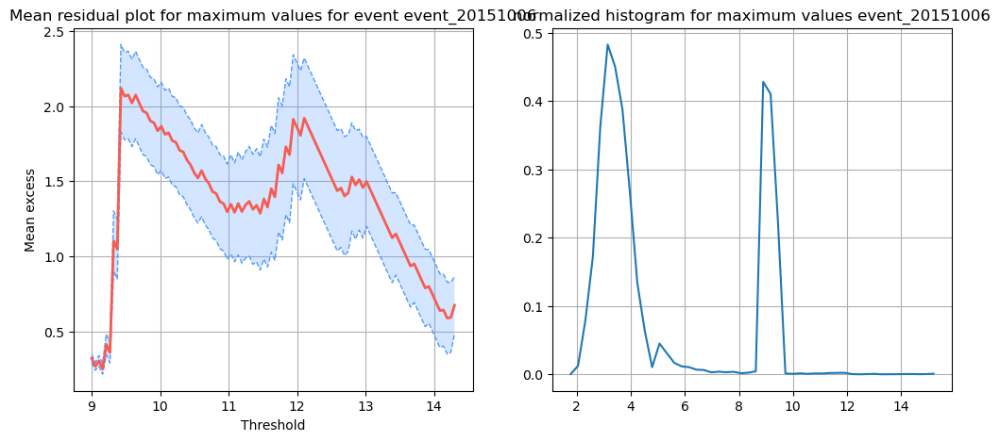

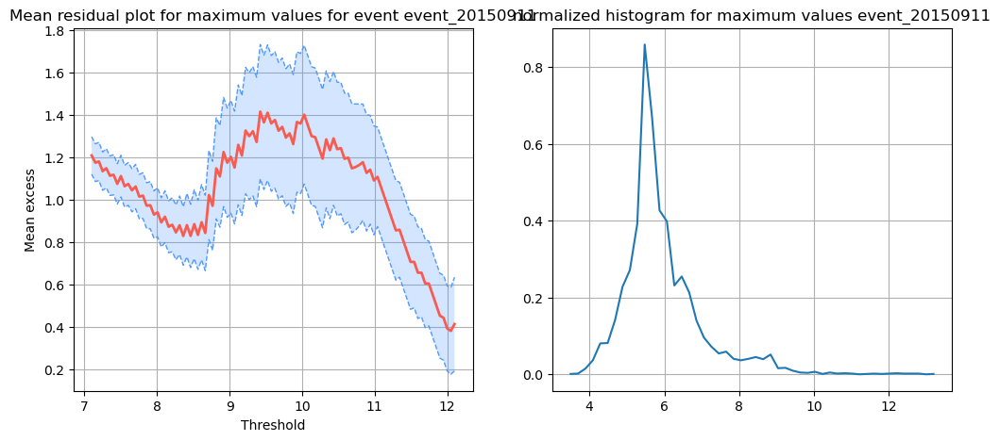

In [13]:
# Read in an concatenate the maximum values for all events
integrated_data_directory = '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/'
files = glob.glob( os.path.join(integrated_data_directory,'*.csv') )

df_max_values = pd.DataFrame(columns=['datetimes','max values'])
df_AE = pd.DataFrame(columns=['datetimes','AE index'])

for f in files:
    df_max_values_loop = pd.DataFrame(columns=['datetimes','max values'])
    df_AE_loop = pd.DataFrame(columns=['datetimes','AE index'])

    df = pd.read_csv(f,index_col=False)
    df = df.drop(columns='Unnamed: 0')
    
    # read in the lat-long values for the sensors in this event
    print('\n\n\n\n----------------------------\nworking on event: {}'.format(f[97:-4])) #f.find('event')
    print('\t--->{}'.format(f))
    
    event_loop = f[97:-4]
    
    # Drop unwanted columns, but save IMF and AE index columns
#     df_SW = df(['datetimes','AE_INDEX','BX_GSE','BY_GSM','BZ_GSM']).copy()
    cols_to_drop_loc = df.columns.get_loc('AE_INDEX')
    df.columns.to_list()[cols_to_drop_loc:]
    df = df.drop(df.columns.to_list()[cols_to_drop_loc:],axis = 1)
    
    file_sensor_locations = os.path.join('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/','risk-resiliency-spwx','data',f[97:-4],'GIC','gic_monitors.csv')
    df_sensor_locations = pd.read_csv(file_sensor_locations)
    
    # Calculate solar wind variables, starting by getting one minute values
    df_SW_oneminute = get_sw_one_minute(df['datetimes'].values[0],df['datetimes'].values[-1])
    
    # Clean the data
    df = clean_GIC_data(df,df_sensor_locations)
    
    # Calculate the maximum values
    max_values = df.max(axis=1)
    df_max_values_loop['datetimes'] = df['datetimes'].values
    df_max_values_loop['max values'] = max_values.values
    
    df_max_values = pd.concat([df_max_values, df_max_values_loop], axis=0)
    
    df_AE_loop['datetimes'] = df_SW_oneminute['datetimes'].values
    df_AE_loop['AE index'] = df_SW_oneminute['AE_INDEX'].values
    
    df_AE = pd.concat([df_AE, df_AE_loop], axis=0)
    
    # plot the mean excess plot for each event
    fig = plt.figure(figsize=(12,5))
    gs = gridspec.GridSpec(1, 2, figure=fig)

    ax1 = plt.subplot(gs[0, 0])
    plot_mean_residual_life(max_values[~np.isnan(max_values)],ax=ax1)
    ax1.set_title('Mean residual plot for maximum values for event ' + event_loop)
    ax1.grid(True)

    ax2 = plt.subplot(gs[0, 1])
    counts, bin_edges = np.histogram(max_values[~np.isnan(max_values)], 
                                     bins=50,
                                     density=True)    
    plt.plot(bin_edges[1:],counts)    
    ax2.set_title('normalized histogram for maximum values ' + event_loop)
    ax2.grid(True)
#     plt.show()
    
    plt.savefig('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/figures/max_vals_event_'+event_loop)
    

In [15]:
df_max_values['datetimes'] = pd.to_datetime(df_max_values['datetimes'])
df_max_values.set_index('datetimes', inplace=True)

df_AE['datetimes'] = pd.to_datetime(df_AE['datetimes'])
df_AE.set_index('datetimes', inplace=True)

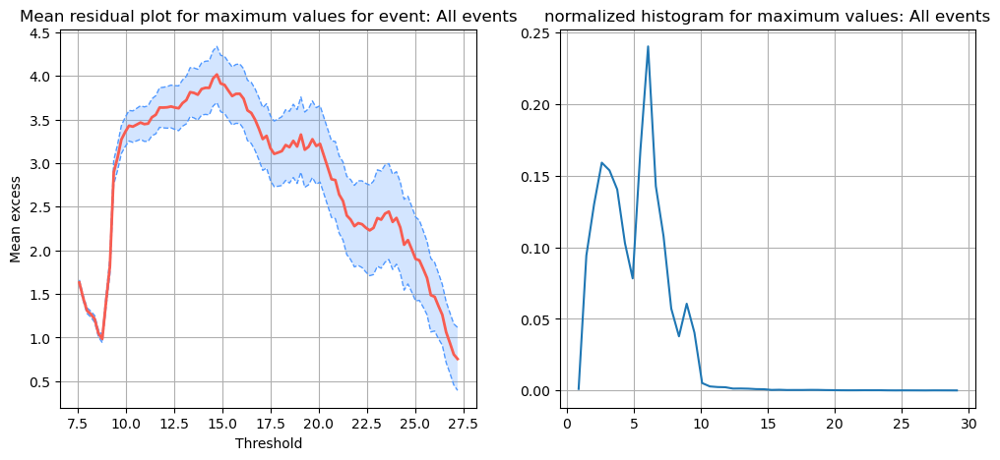

In [21]:
# plot the full mean excess plot for all events, using maximum value for a given time step
fig = plt.figure(figsize=(12,5))
gs = gridspec.GridSpec(1, 2, figure=fig)

ax1 = plt.subplot(gs[0, 0])
plot_mean_residual_life(df_max_values['max values'][~np.isnan(df_max_values['max values'].values)],ax=ax1)
ax1.set_title('Mean residual plot for maximum values for event: All events')
ax1.grid(True)

ax2 = plt.subplot(gs[0, 1])
counts, bin_edges = np.histogram(df_max_values['max values'][~np.isnan(df_max_values['max values'].values)].values, 
                                 bins=50,
                                 density=True)    
plt.plot(bin_edges[1:],counts)    
ax2.set_title('normalized histogram for maximum values: All events')
ax2.grid(True)
plt.show()

In [ ]:

import plotly.graph_objects as go
import plotly.offline as pyo
from plotly.subplots import make_subplots


fig = make_subplots(rows=2, cols=1,shared_xaxes=True,)

fig.add_trace(go.Scatter(
                    x=df_AE.index,
                    y=df_AE['AE index'].values,
                    mode='markers',
                    name='AE Index'
                  ), 
              row=1, col=1)
,

fig.add_trace(go.Scatter(
                    x=df_max_values.index,
                    y=df_max_values,
                    mode='markers',
                    name='Max GIC'
                  ), 
              row=2, col=1)

fig.update_xaxes(range=[df_max_values.index[0], df_max_values.index[-1]])
fig.show()

In [181]:
df_max_values


,max values,max_values
datetimes,,
2015-09-19 00:00:00,NaN,NaN
2015-09-19 00:00:10,NaN,NaN
2015-09-19 00:00:20,NaN,NaN
2015-09-19 00:00:30,NaN,NaN
2015-09-19 00:00:40,NaN,NaN
...,...,...
2015-09-12 23:59:20,NaN,NaN
2015-09-12 23:59:30,NaN,NaN
2015-09-12 23:59:40,NaN,NaN


In [47]:
# Create a list of the unique GIC sensor IDs across all events
integrated_data_directory = '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/'
files = glob.glob( os.path.join(integrated_data_directory,'*.csv') )

sensor_IDs_all = []

for f in files:
    df = pd.read_csv(f,index_col=False)
    df = df.drop(columns='Unnamed: 0')
    
    
    # read in the lat-long values for the sensors in this event
    print('\n\n\n\n----------------------------\nworking on event: {}'.format(f[97:-4])) #f.find('event')
    print('\t--->{}'.format(f))
    
    
    # Drop unwanted columns, but save IMF and AE index columns
    cols_to_drop_loc = df.columns.get_loc('AE_INDEX')
    df.columns.to_list()[cols_to_drop_loc:]
    df = df.drop(df.columns.to_list()[cols_to_drop_loc:],axis = 1)
    
    file_sensor_locations = os.path.join('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/','risk-resiliency-spwx','data',f[97:-4],'GIC','gic_monitors.csv')
    df_sensor_locations = pd.read_csv(file_sensor_locations)
    
    # Clean the data
    df = clean_GIC_data(df,df_sensor_locations)
    
    df = df.drop(['datetimes'],axis=1)
    
    # Append to the running list of sensor IDs
    sensor_IDs_all += df.columns.to_list()
    






----------------------------
working on event: event_20150919
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150919.csv
cols_to_drop after first filter = ['10425']
cols_to_drop after second filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10385', '10387', '10388', '10433', '10436']
cols_to_drop after third filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10385', '10387', '10388', '10433', '10436', '10200', '10412', '10406', '10361', '10407', '1041





----------------------------
working on event: event_20131002
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20131002.csv
cols_to_drop after first filter = ['10115', '10116', '10112', '10323', '10121', '10119', '10425']
cols_to_drop after second filter = ['10115', '10116', '10112', '10323', '10121', '10119', '10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10378', '10379', '10380', '10382', '10384', '10386', '10388', '10433', '10436']
cols_to_drop after third filter = ['10115', '10116', '10112', '10323', '10121', '10119', '10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10378', '10379', '1038





----------------------------
working on event: event_20170907
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20170907.csv
cols_to_drop after first filter = ['10427', '10425', '10084']
cols_to_drop after second filter = ['10427', '10425', '10084', '10072', '10098', '10224', '10300', '10320', '10338', '10342', '10344', '10345', '10347', '10078', '10081', '10084', '10085', '10230', '10231', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10334', '10335', '10346', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10421', '10220', '10290', '10378', '10379', '10380', '10381', '10383', '10384', '10385', '10386', '10388', '10433', '10436']
cols_to_drop after third filter = ['10427', '10425', '10084', '10072', '10098', '10224', '10300', '10320', '10338', '10342', '10344', '10345', '10347', '10078', '10081', '10084', '10085', '10230', '1023

In [50]:
sensor_IDs_all_ints = [int(x) for x in sensor_IDs_all]
print(len(sensor_IDs_all_ints))
sensor_IDs_all_ints = np.unique(sensor_IDs_all_ints)
print(len(sensor_IDs_all_ints))

539
92




		 PROGRESS = 2.1739130434782608 




----------------------------
working on sensor ID = 10066


		 PROGRESS = 3.260869565217391 




----------------------------
working on sensor ID = 10071


		 PROGRESS = 4.3478260869565215 




----------------------------
working on sensor ID = 10074


		 PROGRESS = 5.434782608695652 




----------------------------
working on sensor ID = 10075


		 PROGRESS = 6.521739130434782 




----------------------------
working on sensor ID = 10076


		 PROGRESS = 7.608695652173914 




----------------------------
working on sensor ID = 10077


		 PROGRESS = 8.695652173913043 




----------------------------
working on sensor ID = 10078


		 PROGRESS = 9.782608695652174 




----------------------------
working on sensor ID = 10079


		 PROGRESS = 10.869565217391305 




----------------------------
working on sensor ID = 10080


		 PROGRESS = 11.956521739130435 




----------------------------
working on sensor ID = 10085


		 PROGRESS = 13.0434782

/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2351: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2352: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc




		 PROGRESS = 20.652173913043477 




----------------------------
working on sensor ID = 10120


		 PROGRESS = 21.73913043478261 




----------------------------
working on sensor ID = 10180


		 PROGRESS = 22.82608695652174 




----------------------------
working on sensor ID = 10181


		 PROGRESS = 23.91304347826087 




----------------------------
working on sensor ID = 10183


/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/3356826636.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12,5))




		 PROGRESS = 25.0 




----------------------------
working on sensor ID = 10184


		 PROGRESS = 26.08695652173913 




----------------------------
working on sensor ID = 10185


		 PROGRESS = 27.173913043478258 




----------------------------
working on sensor ID = 10186


/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2351: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2352: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc




		 PROGRESS = 28.26086956521739 




----------------------------
working on sensor ID = 10187


		 PROGRESS = 29.347826086956523 




----------------------------
working on sensor ID = 10188


		 PROGRESS = 30.434782608695656 




----------------------------
working on sensor ID = 10189


/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2351: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2352: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc




		 PROGRESS = 31.521739130434785 




----------------------------
working on sensor ID = 10190


		 PROGRESS = 32.608695652173914 




----------------------------
working on sensor ID = 10191


		 PROGRESS = 33.69565217391305 




----------------------------
working on sensor ID = 10192


		 PROGRESS = 34.78260869565217 




----------------------------
working on sensor ID = 10193


		 PROGRESS = 35.869565217391305 




----------------------------
working on sensor ID = 10194


		 PROGRESS = 36.95652173913043 




----------------------------
working on sensor ID = 10195


		 PROGRESS = 38.04347826086957 




----------------------------
working on sensor ID = 10196


		 PROGRESS = 39.130434782608695 




----------------------------
working on sensor ID = 10197


		 PROGRESS = 40.21739130434783 




----------------------------
working on sensor ID = 10198


		 PROGRESS = 41.30434782608695 




----------------------------
working on sensor ID = 10199


		 PROGRESS = 42.3913043

/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2351: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2352: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc




		 PROGRESS = 44.565217391304344 




----------------------------
working on sensor ID = 10203


		 PROGRESS = 45.65217391304348 




----------------------------
working on sensor ID = 10204


		 PROGRESS = 46.73913043478261 




----------------------------
working on sensor ID = 10205


		 PROGRESS = 47.82608695652174 




----------------------------
working on sensor ID = 10206


		 PROGRESS = 48.91304347826087 




----------------------------
working on sensor ID = 10207


		 PROGRESS = 50.0 




----------------------------
working on sensor ID = 10208


		 PROGRESS = 51.08695652173913 




----------------------------
working on sensor ID = 10212


		 PROGRESS = 52.17391304347826 




----------------------------
working on sensor ID = 10213


		 PROGRESS = 53.2608695652174 




----------------------------
working on sensor ID = 10214


		 PROGRESS = 54.347826086956516 




----------------------------
working on sensor ID = 10215


		 PROGRESS = 55.434782608695656 




--

/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2351: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2352: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc




		 PROGRESS = 58.69565217391305 




----------------------------
working on sensor ID = 10221


		 PROGRESS = 59.78260869565217 




----------------------------
working on sensor ID = 10240


		 PROGRESS = 60.86956521739131 




----------------------------
working on sensor ID = 10248


		 PROGRESS = 61.95652173913043 




----------------------------
working on sensor ID = 10250


		 PROGRESS = 63.04347826086957 




----------------------------
working on sensor ID = 10251


		 PROGRESS = 64.13043478260869 




----------------------------
working on sensor ID = 10252


		 PROGRESS = 65.21739130434783 




----------------------------
working on sensor ID = 10257


		 PROGRESS = 66.30434782608695 




----------------------------
working on sensor ID = 10261


		 PROGRESS = 67.3913043478261 




----------------------------
working on sensor ID = 10273


		 PROGRESS = 68.47826086956522 




----------------------------
working on sensor ID = 10275


		 PROGRESS = 69.565217391304

/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2351: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2352: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc




		 PROGRESS = 81.52173913043478 




----------------------------
working on sensor ID = 10325


		 PROGRESS = 82.6086956521739 




----------------------------
working on sensor ID = 10326


/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2351: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2352: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc




		 PROGRESS = 83.69565217391305 




----------------------------
working on sensor ID = 10331


		 PROGRESS = 84.78260869565217 




----------------------------
working on sensor ID = 10376


/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2351: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2352: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc




		 PROGRESS = 85.86956521739131 




----------------------------
working on sensor ID = 10377


		 PROGRESS = 86.95652173913044 




----------------------------
working on sensor ID = 10382


		 PROGRESS = 88.04347826086956 




----------------------------
working on sensor ID = 10383


		 PROGRESS = 89.13043478260869 




----------------------------
working on sensor ID = 10387


		 PROGRESS = 90.21739130434783 




----------------------------
working on sensor ID = 10388


/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2351: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2352: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc




		 PROGRESS = 91.30434782608695 




----------------------------
working on sensor ID = 10397


		 PROGRESS = 92.3913043478261 




----------------------------
working on sensor ID = 10398


		 PROGRESS = 93.47826086956522 




----------------------------
working on sensor ID = 10402


		 PROGRESS = 94.56521739130434 




----------------------------
working on sensor ID = 10404


		 PROGRESS = 95.65217391304348 




----------------------------
working on sensor ID = 10409


		 PROGRESS = 96.73913043478261 




----------------------------
working on sensor ID = 10421


		 PROGRESS = 97.82608695652173 




----------------------------
working on sensor ID = 10423


		 PROGRESS = 98.91304347826086 




----------------------------
working on sensor ID = 10440


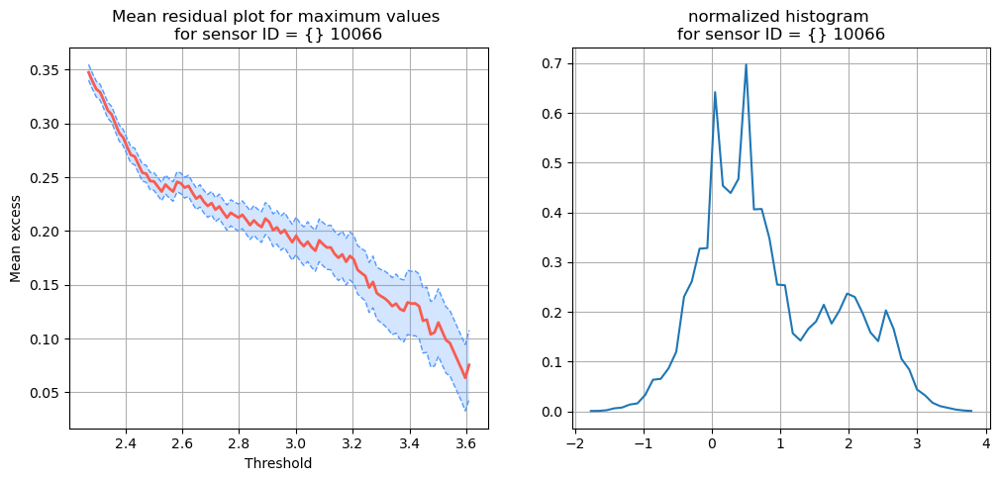

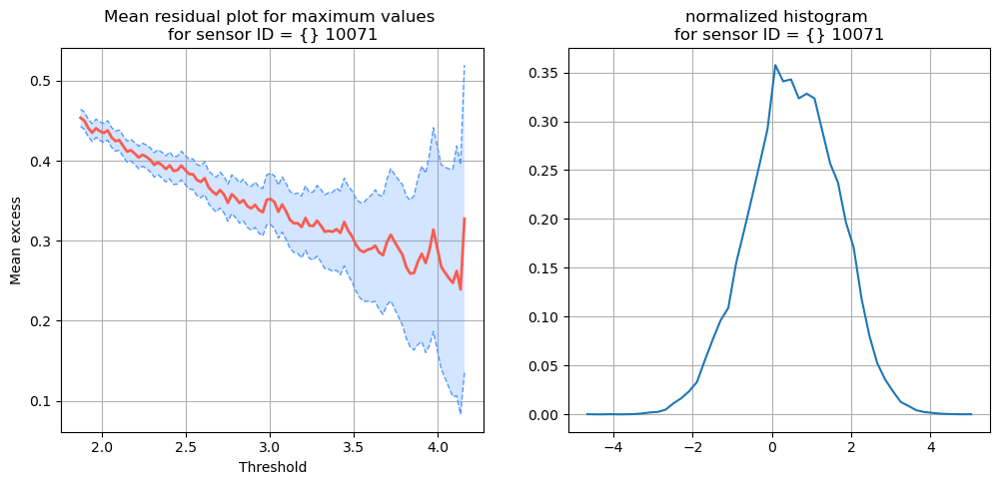

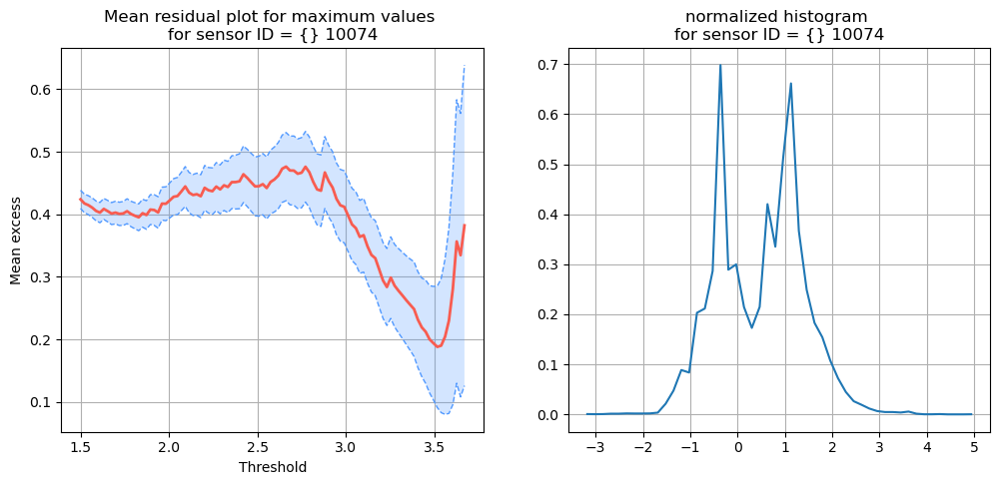

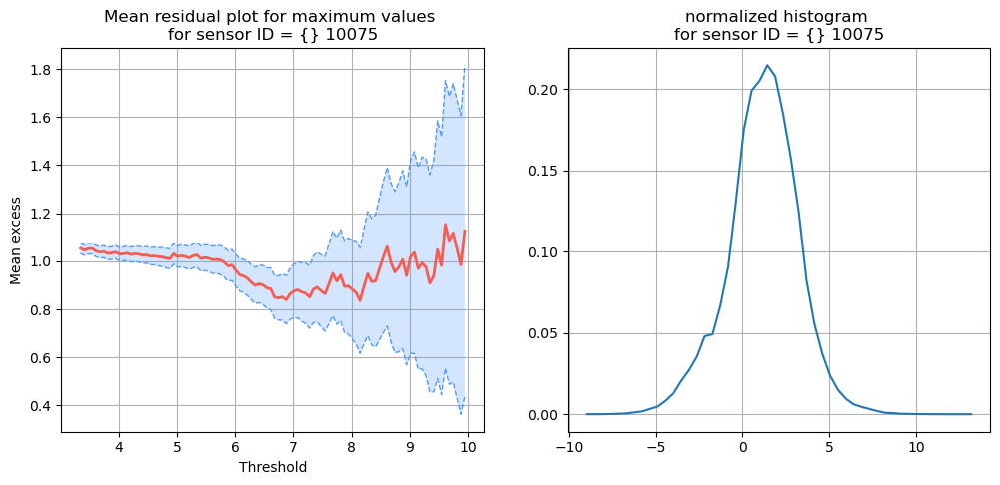

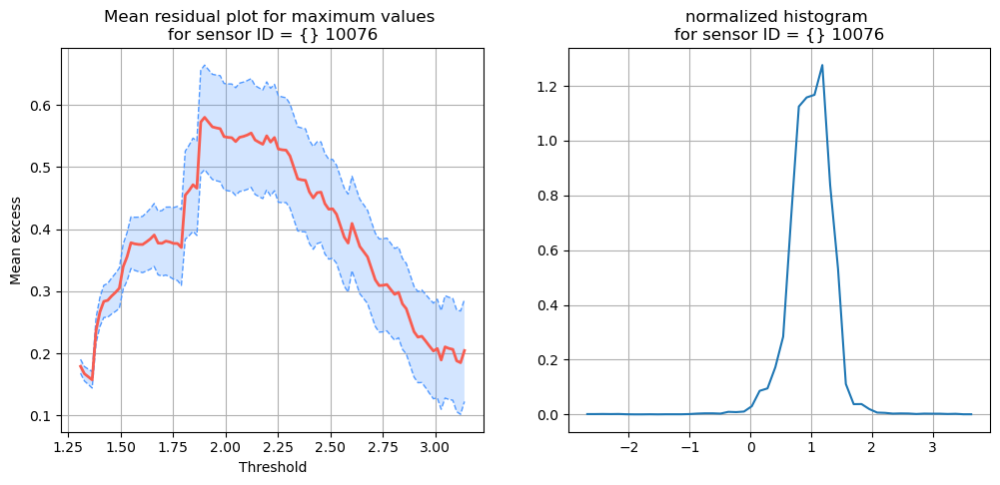

...

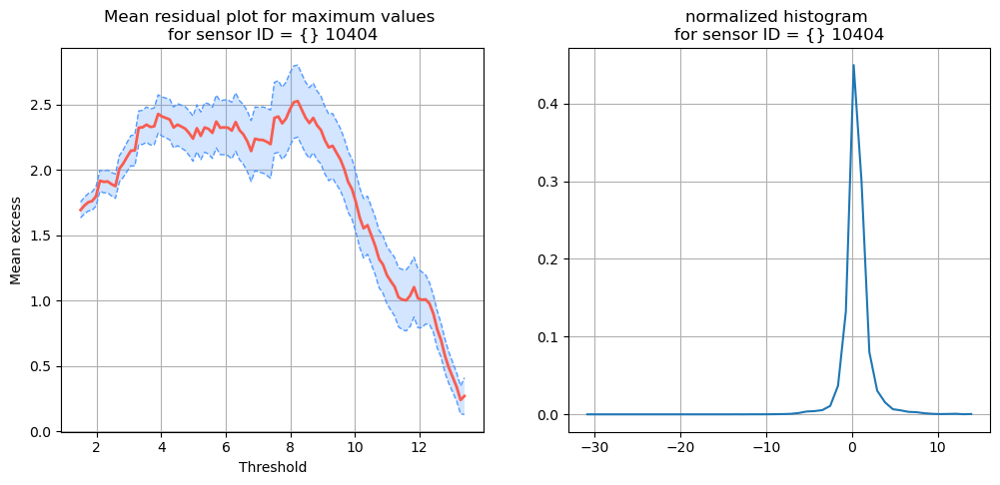

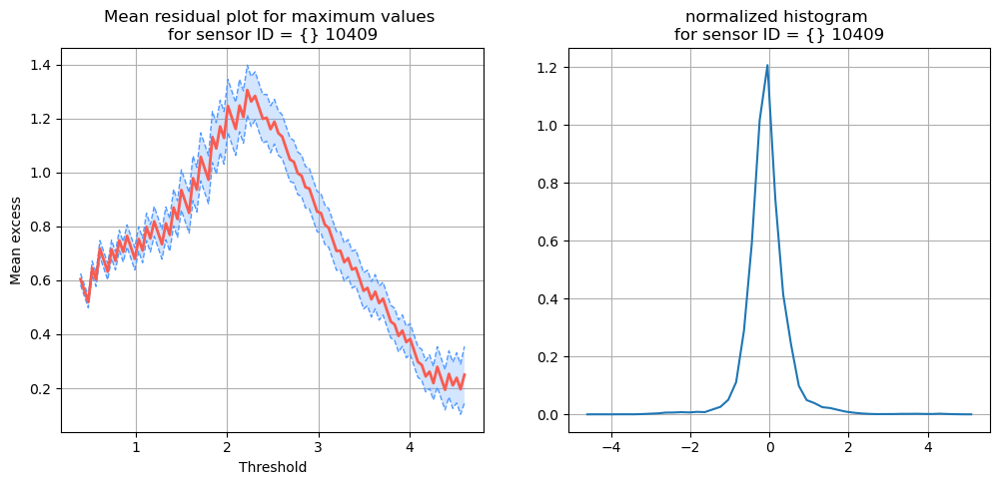

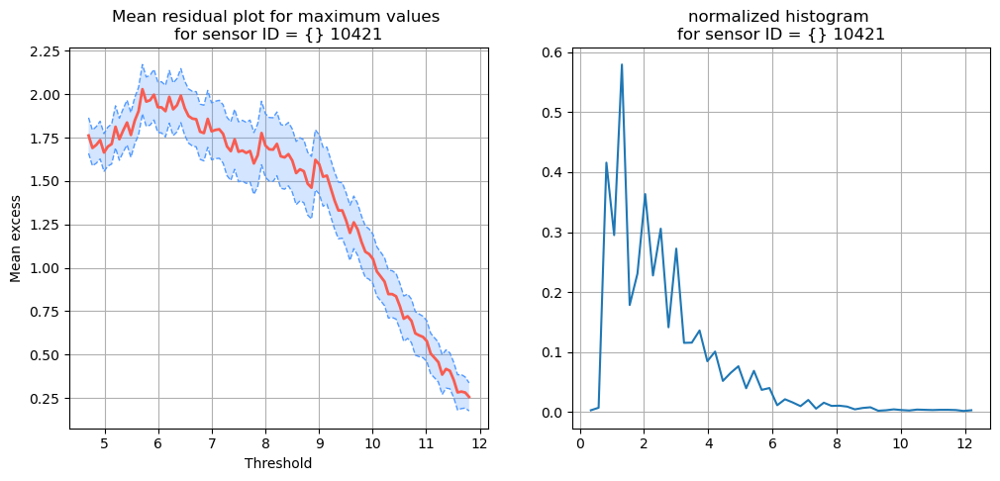

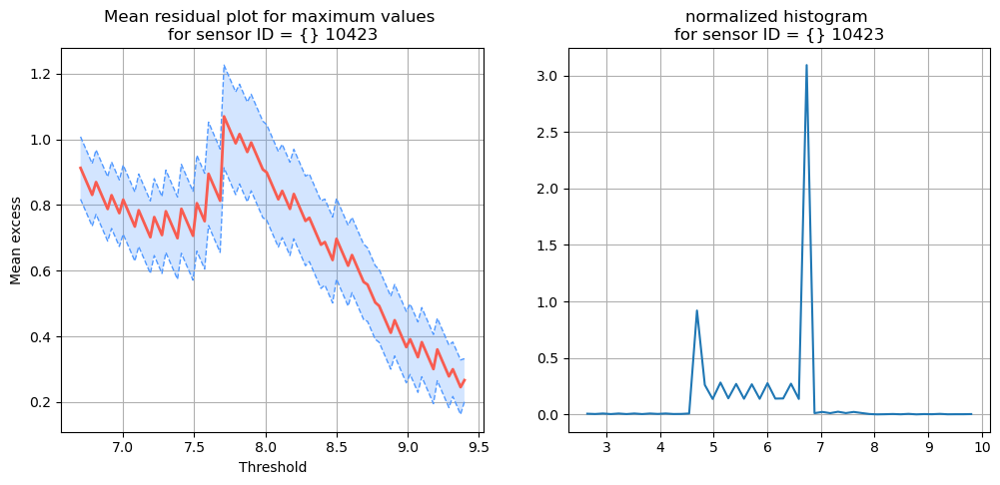

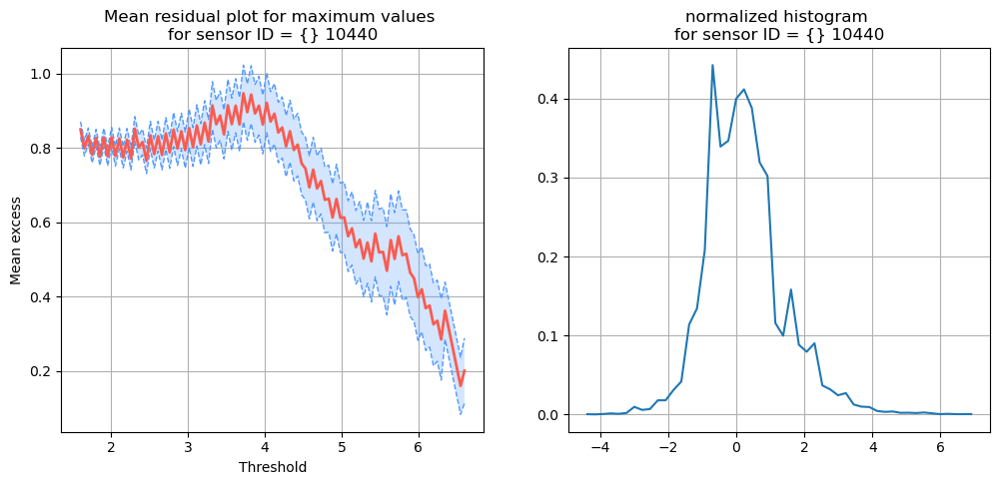

In [74]:
# Loop through the sensor IDs and create a dataframe for each with all GIC values across events


integrated_data_directory = '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/'
files = glob.glob( os.path.join(integrated_data_directory,'*.csv') )


for s in sensor_IDs_all_ints[2:]:
    print('\n\n\t\t PROGRESS = {} \n\n'.format((np.where(sensor_IDs_all_ints == s)[0][0] / len(sensor_IDs_all_ints))*100))
    print('\n\n----------------------------\nworking on sensor ID = {}'.format( s ))
    
    # create the dataframe 
    df_s = pd.DataFrame(columns=['datetimes',str(s)])
    

    for f in files:

        df = pd.read_csv(f,index_col=False)
        df = df.drop(columns='Unnamed: 0')

        event_loop = f[97:-4]

        # Drop unwanted columns, but save IMF and AE index columns
    #     df_SW = df(['datetimes','AE_INDEX','BX_GSE','BY_GSM','BZ_GSM']).copy()
        cols_to_drop_loc = df.columns.get_loc('AE_INDEX')
        df.columns.to_list()[cols_to_drop_loc:]
        df = df.drop(df.columns.to_list()[cols_to_drop_loc:],axis = 1)

        file_sensor_locations = os.path.join('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/','risk-resiliency-spwx','data',f[97:-4],'GIC','gic_monitors.csv')
        df_sensor_locations = pd.read_csv(file_sensor_locations)

        # Clean the data
        df = clean_GIC_data(df,df_sensor_locations)
        
        if str(s) in df.columns:
            columns_to_keep = ['datetimes',str(s)]

            # Drop all columns except those in columns_to_keep
            df = df[columns_to_keep]
            
            df_s = pd.concat([df_s, df], axis=0)

    
    
    # plot the mean excess plot for each event
    fig = plt.figure(figsize=(12,5))
    gs = gridspec.GridSpec(1, 2, figure=fig)

    ax1 = plt.subplot(gs[0, 0])
    plot_mean_residual_life(df_s[str(s)][~np.isnan(df_s[str(s)])],ax=ax1)
    ax1.set_title('Mean residual plot for maximum values \nfor sensor ID = {} ' + str(s))
    ax1.grid(True)

    ax2 = plt.subplot(gs[0, 1])
    counts, bin_edges = np.histogram(df_s[str(s)].values[~np.isnan(df_s[str(s)].values)], 
                                     bins=50,
                                     density=True)    
    plt.plot(bin_edges[1:],counts)    
    ax2.set_title('normalized histogram \nfor sensor ID = {} ' + str(s))
    ax2.grid(True)
#     plt.show()
    
    plt.savefig('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/figures/sensor_IDs_EVA/mean_residual_'+str(s))
    


In [ ]:
# unfinished

def power_spectrum_gic_event():
    
    '''
    input: dataframe with all time series from event over the same time steps
    '''


    # Calculate power spectrum for each time series using FFT
    power_spectra = []
    for ts in time_series:
        fft_vals = np.fft.fft(ts)
        power = np.abs(fft_vals) ** 2
        power_spectra.append(power)

    # Frequencies corresponding to the FFT values
    frequencies = np.fft.fftfreq(num_points, d=time[1] - time[0])

    # Visualize the power spectra
    plt.figure(figsize=(10, 6))
    for i, power in enumerate(power_spectra):
        plt.plot(frequencies, power, label=f"Time Series {i+1}")

    plt.xlabel('Frequency')
    plt.ylabel('Power')
    plt.title('Power Spectra of Time Series')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
# unfinished


# Calculate and visualize the PDF of GIC data
nbins = 50

# Initialize arrays to collect histogram values and bin centers
all_hist = np.zeros(nbins)
all_bin_edges = None


df_total = pd.DataFrame()

for f in files[0:]:
    df = pd.read_csv(f,index_col=False)
    df = df.drop(columns='Unnamed: 0')
    
    # read in the lat-long values for the sensors in this event
    print('\n\n----------------------------\nworking on event: {}'.format(f[97:-4])) #f.find('event')
#     print('\t--->{}'.format(f))
    file_sensor_locations = os.path.join('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/','risk-resiliency-spwx','data',f[97:-4],'GIC','gic_monitors.csv')

#     print('\t--->{}'.format(file_sensor_locations))
    df_sensor_locations = pd.read_csv(file_sensor_locations)
    
    # Drop unwanted columns, but save IMF and AE index columns
#     df_SW = df(['datetimes','AE_INDEX','BX_GSE','BY_GSM','BZ_GSM']).copy()
    cols_to_drop_loc = df.columns.get_loc('AE_INDEX')
    df.columns.to_list()[cols_to_drop_loc:]
    df = df.drop(df.columns.to_list()[cols_to_drop_loc:],axis = 1)
    
    
    # Clean the data
    df = clean_GIC_data(df,df_sensor_locations)
    df  = df.drop(['datetimes'])
    
    df_total = pd.concat([df_total, df], axis=1)


            
            
# Calculate histogram
flattened_data = df_total.values.flatten()
hist, bin_edges = np.histogram(df_total.values[~np.isnan(flattened_data)], bins=nbins, density=False)

# Accumulate histogram values and save bin edges (only once)
all_hist += hist
if all_bin_edges is None:
    all_bin_edges = bin_edges

# Calculate bin centers from bin edges
all_bin_centers = (all_bin_edges[:-1] + all_bin_edges[1:]) / 2

# Normalize histogram values to calculate PDF
pdf_values = all_hist / np.sum(all_hist)

# Plot the PDF
plt.bar(all_bin_centers, pdf_values, width=(all_bin_edges[1] - all_bin_edges[0]), alpha=0.6)
plt.xlabel('Value')
plt.ylabel('Probability Density')
plt.title('Probability Density Function (PDF)')
plt.grid(True)
plt.show()